# 8. Interval constraint satisfaction

## Constraints

A general **constraint satisfaction problem** consists of finding the **feasible set** that satisfies a collection of constraints, i.e. inequalities (or relations) relating the variables, such as $0.5 \le \sin(x^2 + y^3) \le 1$. 

The difference from the case of 
We can use a branch-and-prune--type method to find sets that are guaranteed to satisfy all the constraints, to be outside the feasible set, or unknown.

The difference with inequalities (compared to finding roots), as we saw in notebook 4, is that we are interested in both an **inner approximation** &ndash; boxes that are guaranteed to lie *inside* the feasible set, i.e. that satisfy all the constraints -- and an **outer approximation** -- a set that is guaranteed to enclose the feasible set.

In principle we can just modify the branch-and-prune algorithm to distinguish between boxes that are inside or outside, as in notebook 4.

However, in high dimensions bisection leads to exponential complexity. If we want to use branch-and-X methods in high dimensions, we need to find a way to eliminate boxes more rapidly.

**Interval constraint propagation** is a beautiful technique that allows us to do this. It is applicable to root finding and global optimization, although the released versions of our packages do not yet incorporate this.

Recall that a general constraint takes the form (for the case of 2 variables)

$$ a \le f(x, y) \le b$$

This corresponds to a *subset* of $\mathbb{R}^2$, also called a **relation**.
As in notebook 1, we can decompose $f$ into elementary functions. These are also relations.
It turns out to be useful to use **inverse relations** to *propagate* information from the constraint back down the tree.

Let's look at a simple example.

## Example

Suppose we want to find the set 

$$S := \{(x, y) \in \mathbb{R}^2: 1 \le x^2 + y^2 \le 2 \}.$$

Using `IntervalConstraintProgramming.jl` we can specify this constraint in a *declarative* way using a macro:


In [2]:
using IntervalConstraintProgramming, IntervalArithmetic

In [3]:
C = @constraint 1 <= x^2 + y^2 <= 2

Separator:
  - variables: x, y
  - expression: x ^ 2 + y ^ 2 ∈ [1, 2]

If we apply this to an input box $X$, it attempts to *contract* the box by removing pieces it can guarantee are outside:

In [4]:
X = (-0.5..3) × (-3..10)

[-0.5, 3] × [-3, 10]

In [5]:
C(X)

([-0.5, 1.41422] × [-1.41422, 1.41422], [-0.5, 3] × [-3, 10])

We can run a branch-and-prune&ndash;type algorithm using the `pave` function:

In [6]:
p = pave(C, X, 0.01)

Paving:
- tolerance ϵ = 0.01
- inner approx. of length 1344
- boundary approx. of length 1344

The inner approximation is a list of boxes that are guaranteed to satisfy the constraint. The boxes outside the constraint set have been removed. What is left is on the boundary.

In [7]:
using Plots

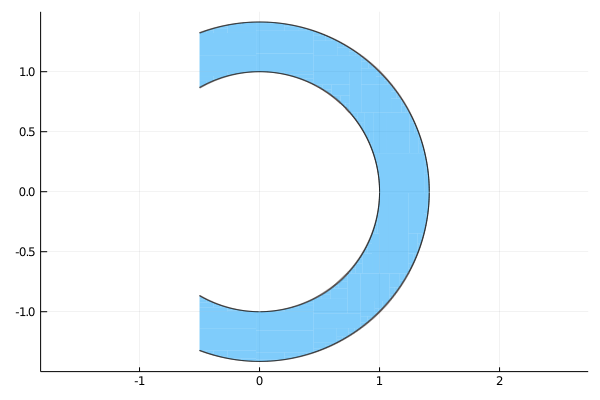

In [8]:
plot(p.inner, lw=0, ratio=1, leg=false)
plot!(p.boundary)

In [ ]:
X = (0.5..1.6) × (0.2..0.6)

The action of the contractor is as follows: We start with the large box and it excludes the region which has been proved to lie outside the constraint set:

In [ ]:
plot!(X)
plot!(C(X)[1])

## Contractors by hand

How does this contractor work? It uses **interval constraint propagation**, as follows.

We decompose the expression $x^2 + y^2$ into its component elementary functions:

In [9]:
using TreeView

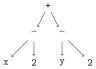

In [10]:
@tree x^2 + y^2

Let's start from no information:

In [11]:
x = y = -∞..∞

[-∞, ∞]

We introduce new variables at the nodes of the tree and evaluate them using interval arithmetic:

In [12]:
a = x^2

[0, ∞]

Note that this is really a function, $a(x) = x^2$, or a relation, $\phi_1(a, x) = 0$ where $\phi_1(a, x) = a - x^2$.

In [15]:
b = y^2

[0, ∞]

In [16]:
c = a + b

[0, ∞]

Since $c$ corresponds to $x^2 + y^2$, we need to impose the constraint on $c$. 

The constraint is given by 

In [17]:
constraint = 1..2

[1, 2]

The values of interest to us are

In [18]:
c′ = c ∩ constraint

[1, 2]

Now we *propagate* this information back down the tree by looking for consistency along each edge of the tree.

We have $c = a + b$, so $a = c - b$.  This is a *partial inverse* or *projection* of the constraint / relation.

The values of $a$ that are consistent with $c'$ and with $b$ are 

In [19]:
c′ - b

[-∞, 2]

But we also have a restriction on the allowed values of $a$ coming from its definition in terms of $x$:

In [20]:
a

[0, ∞]

For consistency we need

In [21]:
a′ = a ∩ (c′ - b)

[0, 2]

Similarly

In [22]:
b′ = b ∩ (c′ - a′)

[0, 2]

Finally, we need to invert the relation $a = x^2$, giving $x = \pm \sqrt{a}$:

In [23]:
s = √a′

[0, 1.41422]

In [24]:
x′ = x ∩ (s ∪ -s)

[-1.41422, 1.41422]

and similarly for $y$.

We see that a few steps are enough (in this particular case) to *contract* the whole plane down to a small box that contains the required set.

## Code generation

`IntervalConstraintProgramming.jl` works by using Julia's excellent metaprogramming capabilities to do *code generation*. Indeed, we can look inside the code:

In [25]:
Base.remove_linenums!(C.contractor.forward.code)

quote
    t->begin
            (x, y) = t
            begin
                _a = x ^ 2
                _b = y ^ 2
                _c = _a + _b
            end
            return (_c, (_a, _b))
        end
end

In [26]:
Base.remove_linenums!(C.contractor.backward.code)

quote
    (t1, t2, t3)->begin
            (x, y) = t1
            (_c,) = t2
            (_a, _b) = t3
            begin
                (_c, _a, _b) = plus_rev(_c, _a, _b)
                (_b, y, _) = power_rev(_b, y, 2)
                (_a, x, _) = power_rev(_a, x, 2)
            end
            return (x, y)
        end
end

We see that the forwards pass is identical to our hand-coded version. The backwards pass uses functions like `plus_rev` that
implement the inverse relations; these inverse functions are defined in the `IntervalContractors.jl` package.

## A neat example

An example by Tupper (1996):

In [28]:
using ModelingToolkit

vars = @variables x, y

C = Separator(vars, (y - 5) * cos(4 * sqrt((x - 4)^2 + y^2)) - x * sin(2 * sqrt(x^2 + y^2)) > 0)

Separator:
  - variables: x, y
  - expression: (y - 5) * cos(4 * sqrt((x - 4) ^ 2 + y ^ 2)) - x * sin(2 * sqrt(x ^ 2 + y ^ 2)) == [0, ∞]

In [33]:
Base.remove_linenums!(C.contractor.forward.code)

quote
    t->begin
            (x, y) = t
            begin
                _u = y - 5
                _v = x - 4
                _w = _v ^ 2
                _x = y ^ 2
                _y = _w + _x
                _z = sqrt(_y)
                _a1 = 4_z
                _b1 = cos(_a1)
                _c1 = _u * _b1
                _d1 = x ^ 2
                _e1 = y ^ 2
                _f1 = _d1 + _e1
                _g1 = sqrt(_f1)
                _h1 = 2_g1
                _i1 = sin(_h1)
                _j1 = x * _i1
                _k1 = _c1 - _j1
            end
            return (_k1, (_u, _v, _w, _x, _y, _z, _a1, _b1, _c1, _d1, _e1, _f1, _g1, _h1, _i1, _j1))
        end
end

In [34]:
Base.remove_linenums!(C.contractor.backward.code)

quote
    (t1, t2, t3)->begin
            (x, y) = t1
            (_k1,) = t2
            (_u, _v, _w, _x, _y, _z, _a1, _b1, _c1, _d1, _e1, _f1, _g1, _h1, _i1, _j1) = t3
            begin
                (_k1, _c1, _j1) = minus_rev(_k1, _c1, _j1)
                (_j1, x, _i1) = mul_rev(_j1, x, _i1)
                (_i1, _h1) = sin_rev(_i1, _h1)
                (_h1, _, _g1) = mul_rev(_h1, 2, _g1)
                (_g1, _f1) = sqrt_rev(_g1, _f1)
                (_f1, _d1, _e1) = plus_rev(_f1, _d1, _e1)
                (_e1, y, _) = power_rev(_e1, y, 2)
                (_d1, x, _) = power_rev(_d1, x, 2)
                (_c1, _u, _b1) = mul_rev(_c1, _u, _b1)
                (_b1, _a1) = cos_rev(_b1, _a1)
                (_a1, _, _z) = mul_rev(_a1, 4, _z)
                (_z, _y) = sqrt_rev(_z, _y)
                (_y, _w, _x) = plus_rev(_y, _w, _x)
                (_x, y, _) = power_rev(_x, y, 2)
                (_w, _v, _) = power_rev(_w, _v, 2)
                (_v, x, _) = minus_rev(_v, 

Mike Innes - diffzoo notes

In [29]:
X = IntervalBox(-10..10, 2)

[-10, 10] × [-10, 10]

In [30]:
p = pave(C, X, 0.05)

Paving:
- tolerance ϵ = 0.05
- inner approx. of length 23663
- boundary approx. of length 13882

In [31]:
plot(p.inner, lw=0, ratio=1, leg=false)
plot!(p.boundary, lw=0, ratio=1)

## Optimization:

Constraint: $f(x) < m$